### Student Information
Name: Aliah Gie F. Zabala

Student ID: 113065424

GitHub ID: 182365283

---

### Instructions

1. First: do the **take home** exercises in the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git). You may need to copy some cells from the Lab notebook to this notebook. __This part is worth 20% of your grade.__


2. Second: follow the same process from the [DM2024-Lab1-Master](https://github.com/didiersalazar/DM2024-Lab1-Master.git) on **the new dataset**. You don't need to explain all details as we did (some **minimal comments** explaining your code are useful though).  __This part is worth 30% of your grade.__
    - Download the [the new dataset](https://huggingface.co/datasets/Senem/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data). The dataset contains a `sentiment` and `comment` columns, with the sentiment labels being: 'nostalgia' and 'not nostalgia'. Read the specificiations of the dataset for background details. 
    - You are allowed to use and modify the `helper` functions in the folder of the first lab session (notice they may need modification) or create your own.


3. Third: please attempt the following tasks on **the new dataset**. __This part is worth 30% of your grade.__
    - Generate meaningful **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. This will generating a document matrix, however, the weights will be computed differently (using the TF-IDF value of each word per document as opposed to the word frequency). Refer to this Scikit-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) .
    - Implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Use both the TF-IDF features and word frequency features to build two seperate classifiers. Note that for the TF-IDF features you might need to use other type of NB classifier different than the one in the Master Notebook. Comment on the differences.  Refer to this [article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/).


4. Fourth: In the lab, we applied each step really quickly just to illustrate how to work with your dataset. There are somethings that are not ideal or the most efficient/meaningful. Each dataset can be handled differently as well. What are those inefficent parts you noticed? How can you improve the Data preprocessing for these specific datasets? __This part is worth 10% of your grade.__


5. Fifth: It's hard for us to follow if your code is messy, so please **tidy up your notebook** and **add minimal comments where needed**. __This part is worth 10% of your grade.__


You can submit your homework following these guidelines: [Git Intro & How to hand your homework](https://github.com/didiersalazar/DM2024-Lab1-Master/blob/main/Git%20Intro%20%26%20How%20to%20hand%20your%20homework.ipynb). Make sure to commit and save your changes to your repository __BEFORE the deadline (October 27th 11:59 pm, Sunday)__. 

In [1]:
### Begin Assignment Here
import pandas as pd
import helpers.data_mining_helpers as dmh
import numpy as np
import nltk
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.feature_extraction.text import CountVectorizer

df = pd.read_csv("hf://datasets/Senem/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data/Nostalgic_Sentiment_Analysis_of_YouTube_Comments_Data.csv")
df # note that df is already a Pandas Dataframe
categories = df['sentiment'].unique() # get categories from dataframe

### Take an initial peek into the data

In [2]:
print(df.loc[lambda x: x['sentiment'] == 'nostalgia', :]) # query the first and last 5 records
print(df.loc[lambda x: x['sentiment'] == 'not nostalgia', :]) 

print(df[df['sentiment']=='nostalgia'].iloc[::10][0:10]) # query every 10th record then show the first 10 records only
print(df[df['sentiment']=='not nostalgia'].iloc[::10][0:10])

      sentiment                                            comment
1     nostalgia  The mist beautiful voice ever I listened to hi...
2     nostalgia  I have most of Mr. Reeves songs.  Always love ...
4     nostalgia  listening to his songs reminds me of my mum wh...
5     nostalgia  Every time I heard this song as a child, I use...
6     nostalgia  My dad loved listening to Jim Reeves, when I w...
...         ...                                                ...
1488  nostalgia  Yup !!!!  Bringing back an Enormous amount of ...
1491  nostalgia  real music...how i miss those days...brings ba...
1492  nostalgia  i used to cry over this song cause i had a boy...
1498  nostalgia  I was born in 1954 and started to be aware of ...
1499  nostalgia  This is the first CD I bought after my marriag...

[750 rows x 2 columns]
          sentiment                                            comment
0     not nostalgia  He was a singer with a golden voice that I lov...
3     not nostalgia  30 day le

### Missing Values

In [3]:
df.isnull()

,sentiment,comment
0,False,False
1,False,False
2,False,False
3,False,False
4,False,False
...,...,...
1495,False,False
1496,False,False
1497,False,False
1498,False,False


In [4]:
df.isnull().apply(lambda x: dmh.check_missing_values(x)) # Result : no missing values

,sentiment,comment
0,The amoung of missing records is:,The amoung of missing records is:
1,0,0


### Duplicate Values

In [5]:
print(df.duplicated())
print("No. of duplicates before dropping: " + str(sum(df.duplicated()))) # Result : 1
print(df[df.duplicated(keep=False)]) # get all duplicated elements
df.drop_duplicates(keep="first", inplace=True) # Drop all the duplicated elements
print("No. of duplicates after dropping: " + str(sum(df.duplicated()))) # Result : 0

0       False
1       False
2       False
3       False
4       False
        ...  
1495    False
1496    False
1497    False
1498    False
1499    False
Length: 1500, dtype: bool
No. of duplicates before dropping: 1
        sentiment                                            comment
62  not nostalgia  never heard this song before... WOW What an am...
78  not nostalgia  never heard this song before... WOW What an am...
No. of duplicates after dropping: 0


### Sampling

In [6]:
df_sample = df.sample(n=1000) #random state
print(df_sample.sentiment.value_counts())
print(df.sentiment.value_counts())

sentiment
nostalgia        504
not nostalgia    496
Name: count, dtype: int64
sentiment
nostalgia        750
not nostalgia    749
Name: count, dtype: int64


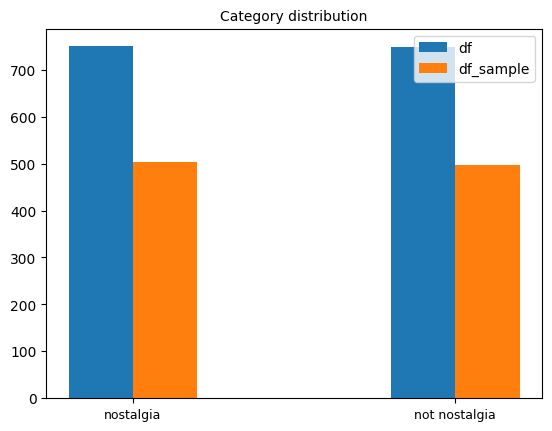

In [7]:
df_headers = list(df.sentiment.value_counts().index)
row = np.arange(len(df_headers))# stores [0, 1, 2, 3]
width = 0.2
plt.bar(row, df.sentiment.value_counts(), width , label='df') #for df dataset
plt.bar(row+width, df_sample.sentiment.value_counts(), width, label='df_sample') #for df_sample dataset, x+width to put the bars next to each other
plt.title('Category distribution', fontsize=10)
plt.xticks(row+width/2, df_headers, fontsize=9) # set the row names to categories, then place them in the middle of two datasets
plt.legend(loc='upper right')
plt.show()

### Feature Creation

In [8]:
df['unigrams'] = df['comment'].apply(lambda df: dmh.tokenize_text(df))
df[0:4]["unigrams"]

0    [He, was, a, singer, with, a, golden, voice, t...
1    [The, mist, beautiful, voice, ever, I, listene...
2    [I, have, most, of, Mr., Reeves, songs, ., Alw...
3    [30, day, leave, from, 1st, tour, in, Viet, Na...
Name: unigrams, dtype: object

In [9]:
count_vect = CountVectorizer()
df_counts = count_vect.fit_transform(df.comment) #learn the vocabulary and return document-term matrix
print(df_counts)

<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 31249 stored elements and shape (1499, 3730)>
  Coords	Values
  (0, 1598)	1
  (0, 3570)	2
  (0, 2973)	1
  (0, 3650)	1
  (0, 1470)	1
  (0, 3534)	1
  (0, 3282)	1
  (0, 2028)	1
  (0, 3336)	1
  (0, 1606)	1
  (0, 233)	2
  (0, 3284)	3
  (0, 3328)	2
  (0, 1651)	2
  (0, 1512)	1
  (0, 1249)	1
  (0, 323)	1
  (0, 214)	1
  (0, 2341)	1
  (0, 15)	1
  (0, 1733)	1
  (0, 3304)	1
  (0, 907)	1
  (0, 258)	2
  (0, 3124)	1
  :	:
  (1498, 2254)	2
  (1498, 1798)	1
  (1498, 3704)	2
  (1498, 1923)	1
  (1498, 3300)	3
  (1498, 3044)	2
  (1498, 1026)	1
  (1498, 2699)	1
  (1498, 3504)	1
  (1498, 1308)	1
  (1498, 208)	2
  (1498, 516)	1
  (1498, 637)	1
  (1498, 78)	1
  (1498, 1132)	1
  (1498, 863)	1
  (1498, 603)	2
  (1498, 3637)	1
  (1498, 1049)	1
  (1498, 87)	1
  (1498, 2027)	1
  (1498, 2089)	1
  (1498, 998)	1
  (1498, 3414)	1
  (1498, 2779)	1


### Term-document matrix

#### Based on Number of Word Counts

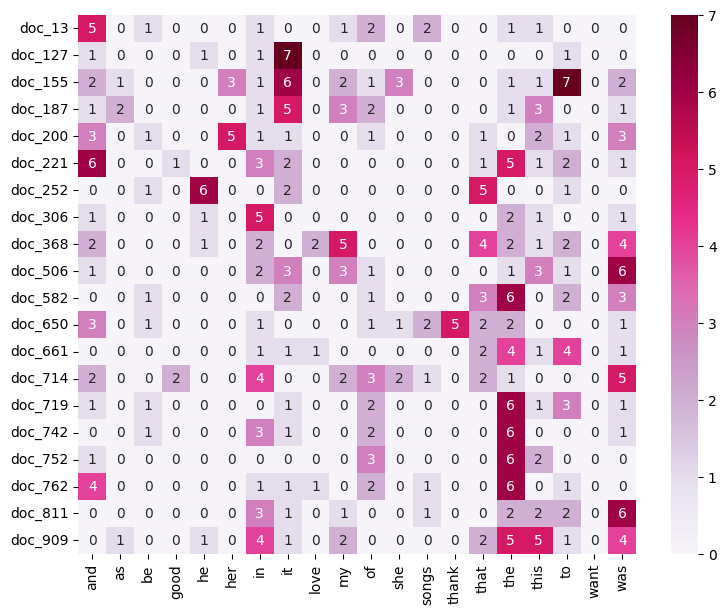

In [10]:
# We can observe a lot of stop words here
indices = np.where(df_counts.toarray()[:,] >= 5) 
index_term = np.unique(indices[1]).reshape(1, -1)
index_docu = np.unique(indices[0]).reshape(1, -1)
index_term_20 = index_term[0][0:20].tolist()
index_docu_20 = index_docu[0][0:20].tolist()

plot_x = [str(i) for i in count_vect.get_feature_names_out()[index_term_20]] #instead of entering the number only, input the name of the term for better visualization
plot_y = ["doc_"+ str(i) for i in index_docu_20]

plot_z = df_counts[index_docu_20, :][:, index_term_20].toarray() #X_counts[how many documents, how many terms]

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=plot_z.max(), annot=True) #changed vmax to fit the data range in the heat map

#### Based on TF-IDF Score

In [11]:
# Generate TF-IDF features 
from sklearn.feature_extraction.text import TfidfTransformer

transformer = TfidfTransformer()
tfidf = transformer.fit_transform(df_counts)

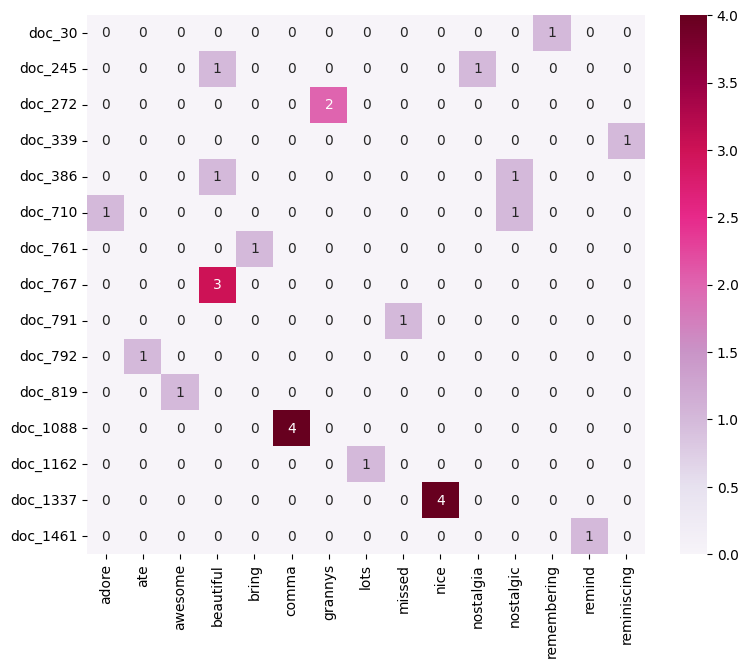

In [12]:
# Eliminate the stop words by using TF-IDF Score instead

indices = np.where(tfidf.toarray()[:,] >= 0.7) # upon testing thresholds 0.1 - 0.9, threshold 0.7 was chosen
index_term = np.unique(indices[1]).reshape(1, -1)
index_docu = np.unique(indices[0]).reshape(1, -1)
index_term_20 = index_term[0][0:20].tolist()
index_docu_20 = index_docu[0][0:20].tolist()

plot_x = [str(i) for i in count_vect.get_feature_names_out()[index_term_20]] #instead of entering the number only, input the name of the term for better visualization
plot_y = ["doc_"+ str(i) for i in index_docu_20]

plot_z = df_counts[index_docu_20, :][:, index_term_20].toarray() #df_counts[how many documents, how many terms]

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=plot_z.max(), annot=True) #changed vmax to fit the data range in the heat map

### Attribute Transformation / Aggregation

In [13]:
term_frequencies = []
for j in range(0,df_counts.shape[1]):
    term_frequencies.append(sum(df_counts[:,j].toarray()))

In [14]:
term_frequencies = np.asarray(df_counts.sum(axis=0))[0]

In [15]:
import plotly.graph_objects as go
# map the 300 words
x = count_vect.get_feature_names_out()[:300]  
y = term_frequencies[:300]

fig = go.Figure([go.Bar(x=x, y=y)])
fig.update_layout(
    xaxis_title='Terms',
    yaxis_title='Frequencies',
    xaxis_tickangle=90, 
    yaxis=dict(
        tickvals=[50, 100, 150, 200, 250, 300, 350],  
        ticktext=['50', '100', '150', '200', '250', '300', '350'],  
    ),
    height=350,
    width=1150,
    font=dict(size=2)
)
fig.show()

### Filter the bar chart based on:

#### Number of words

In [16]:
# Apply filtering and sorting

x = count_vect.get_feature_names_out()[:300]  
y = term_frequencies[:300]

indices = np.where(y >= 4)[0]
sorted_indices = indices[np.argsort(y[indices])[::-1]]

x_sorted = x[sorted_indices] 
y_sorted = y[sorted_indices]

fig = go.Figure([go.Bar(x=x_sorted, y=y_sorted)])
fig.update_layout(
    xaxis_title='Terms',
    yaxis_title='Frequencies',
    xaxis_tickangle=90, 
    height=350,
    width=1150,
    font=dict(size=10)
)
fig.show()

#### TF-IDF Score

In [17]:
tfidf_sums = np.array(tfidf.sum(axis=0)).flatten()

indices = np.where(tfidf_sums >= 0.7)[0] # you can experiment with the threshold

x_filtered = count_vect.get_feature_names_out()[indices[200:300]]  
y_filtered = term_frequencies[indices[200:300]]

sorted_indices = np.argsort(y_filtered)[::-1]

x_sorted = x_filtered[sorted_indices] 
y_sorted = y_filtered[sorted_indices]

fig = go.Figure([go.Bar(x=x_sorted, y=y_sorted)])

fig.update_layout(
    xaxis_title='Terms',
    yaxis_title='Frequencies',
    xaxis_tickangle=90,
    height=350,
    width=1150,
    font=dict(size=10)
)
fig.show()

### Apply Log Distribution

In [18]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]

#### Number of Words

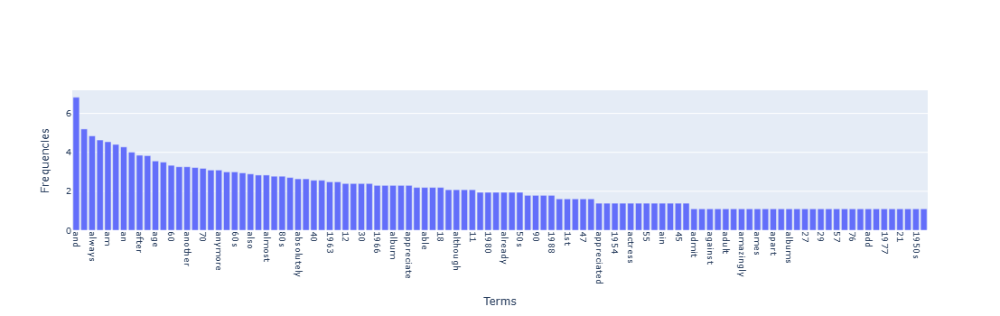

In [19]:
x = count_vect.get_feature_names_out()[:300]  
y = np.array(term_frequencies_log[:300])

indices = np.where(y >= np.log(3))[0]
sorted_indices = indices[np.argsort(y[indices])[::-1]]

x_sorted = x[sorted_indices] 
y_sorted = y[sorted_indices]

fig = go.Figure([go.Bar(x=x_sorted, y=y_sorted)])
fig.update_layout(
    xaxis_title='Terms',
    yaxis_title='Frequencies',
    xaxis_tickangle=90, 
    height=350,
    width=1150,
    font=dict(size=10)
)
fig.show()

#### TF-IDF Score

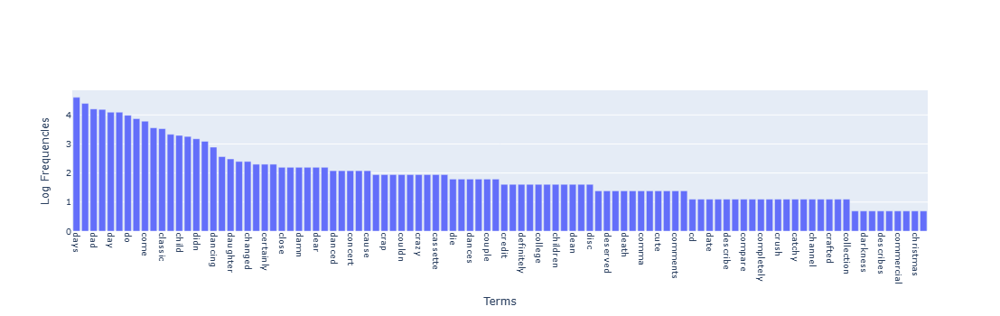

In [20]:
indices = np.where(tfidf_sums >= 0.7)[0] # you can experiment with the threshold

x_filtered = count_vect.get_feature_names_out()  
y_filtered = np.array(term_frequencies_log)

x_filtered = x_filtered[indices[200:300]]
y_filtered = y_filtered[indices[200:300]]

sorted_indices = np.argsort(y_filtered)[::-1]

x_sorted = x_filtered[sorted_indices] 
y_sorted = y_filtered[sorted_indices]
top
fig = go.Figure([go.Bar(x=x_sorted, y=y_sorted)])

fig.update_layout(
    xaxis_title='Terms',
    yaxis_title='Log Frequencies',
    xaxis_tickangle=90,
    height=350,
    width=1150,
    font=dict(size=10)
)
fig.show()

### Using PAMI to get frequent patterns

In [21]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

#Create separate DataFrames for each category
categories = df['sentiment'].unique()  # Get unique category labels
category_dfs = {}  # Dictionary to store DataFrames for each category

for category in categories:
    # Filter the original DataFrame by category
    category_dfs[category] = df[df['sentiment'] == category].copy()

# Function to create term-document frequency DataFrame for each category
def create_term_document_df(df):
    count_vect = CountVectorizer()  # Initialize the CountVectorizer
    df_counts = count_vect.fit_transform(df.comment)  # Transform the text data into word counts
    
    # Get the unique words (vocabulary) from the vectorizer
    words = count_vect.get_feature_names_out()
    
    # Create a DataFrame where rows are documents and columns are words
    term_document_df = pd.DataFrame(df_counts.toarray(), columns=words)
    
    return term_document_df

# Create term-document frequency DataFrames for each category
filt_term_document_dfs = {}  # Dictionary to store term-document DataFrames for each category

for category in categories:
    filt_term_document_dfs[category] = create_term_document_df(category_dfs[category])

In [22]:
# Display the filtered DataFrame for one of the categories, feel free to change the number in the vector
category_number=0 #You can change it from 0 to 3
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
filt_term_document_dfs[categories[category_number]]

Filtered Term-Document Frequency DataFrame for Category not nostalgia:


,00,000,045,10,100,10m,11,12,14,15,...,youngest,youngsters,your,yourself,youth,youtube,yrs,yuo,zealand,zulus
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


#### Term Frequency Distribution of Category not nostalgia

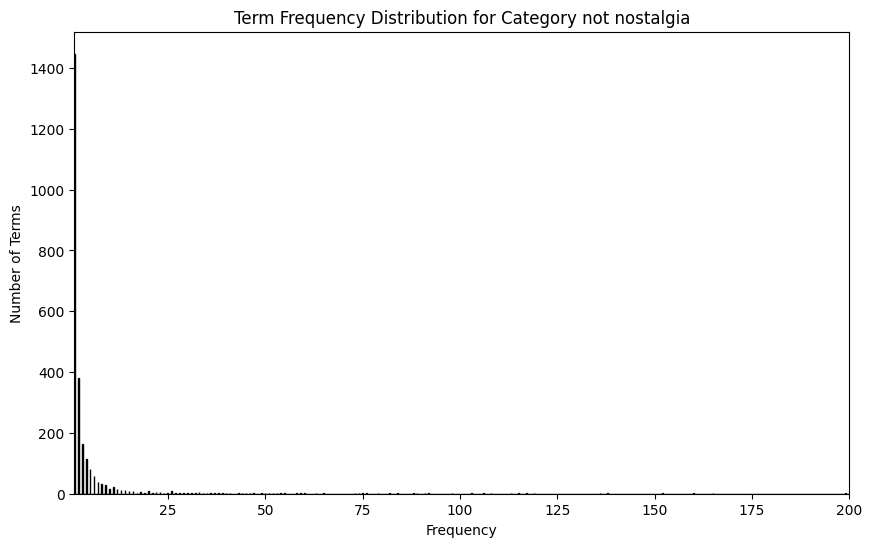

In [23]:
 # Sum over all documents to get total frequency for each word
category_number=0
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(10, 6))
plt.hist(word_counts, bins=5000, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Category {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 200)
plt.show()

#### Term Frequency Distribution of Category nostalgia

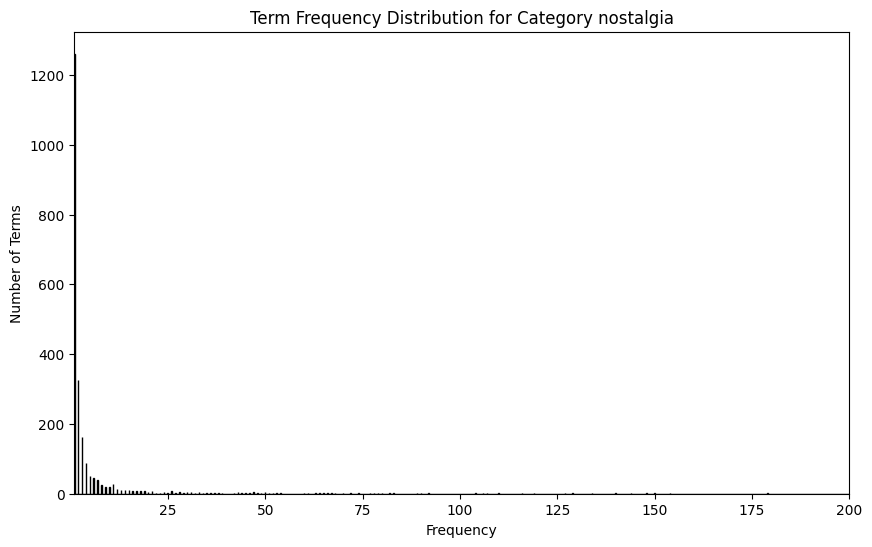

In [24]:
 # Sum over all documents to get total frequency for each word
category_number=1
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()
 
# Visualize the frequency distribution
plt.figure(figsize=(10, 6))
plt.hist(word_counts, bins=5000, color='blue', edgecolor='black')
plt.title(f'Term Frequency Distribution for Category {categories[category_number]}')
plt.xlabel('Frequency')
plt.ylabel('Number of Terms')
plt.xlim(1, 200)
plt.show()

#### Getting the Top 5% words

##### Category: Not nostalgia

In [25]:
category_number=0
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices = np.argsort(word_counts)[::-1]  # Get indices of sorted frequencies
sorted_counts = np.sort(word_counts)[::-1]  # Sort frequencies in descending order

# Calculate the index corresponding to the top 5% most frequent terms
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms)

# Get the indices of the top 5% most frequent terms
top_5_percent_indices = sorted_indices[:top_5_percent_index]

# Filter terms that belong to the top 5% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in top_5_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: not nostalgia
Number of terms in top 5%: 130
Filtered terms: ['the', 'this', 'and', 'to', 'of', 'song', 'it', 'is', 'in', 'you', 'that', 'my', 'love', 'music', 'was', 'for', 'so', 'have', 'one', 'like', 'but', 'he', 'with', 'great', 'all', 'what', 'on', 'not', 'be', 'can', 'me', 'voice', 'just', 'songs', 'beautiful', 'as', 'time', 'her', 'she', 'will', 'they', 'when', 'from', 'his', 'at', 'are', 'always', 'good', 'no', 'know', 'never', 'now', 'about', 'much', 'who', 'really', 'more', 'if', 'we', 'best', 'by', 'ever', 'think', 'would', 'thank', 'only', 'still', 'how', 'don', 'has', 'very', 'am', 'there', 'out', 'him', 'could', 'these', 'up', 'old', 'listen', 'hear', 'do', 'an', 'singer', 'many', 'had', 'here', 'version', 'too', 'such', 'today', 'been', 'world', 'your', 'people', 'most', 'get', 'video', 'heard', 'man', 'some', 'listening', 'sing', 'than', 'were', 'years', 'real', 'heart', 'nice', 'singing', 'their', 'better', 'life', 'its', 'day', 'sad', 'god', 'then', 'way', '

##### Category: nostalgia

In [26]:
category_number=1 
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in descending order
sorted_indices = np.argsort(word_counts)[::-1]  # Get indices of sorted frequencies
sorted_counts = np.sort(word_counts)[::-1]  # Sort frequencies in descending order

# Calculate the index corresponding to the top 5% most frequent terms
total_terms = len(sorted_counts)
top_5_percent_index = int(0.05 * total_terms)

# Get the indices of the top 5% most frequent terms
top_5_percent_indices = sorted_indices[:top_5_percent_index]

# Filter terms that belong to the top 5% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in top_5_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in top 5%: {top_5_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: nostalgia
Number of terms in top 5%: 114
Filtered terms: ['the', 'my', 'this', 'to', 'and', 'song', 'was', 'of', 'in', 'it', 'me', 'back', 'memories', 'when', 'so', 'years', 'that', 'on', 'love', 'for', 'time', 'you', 'remember', 'old', 'with', 'is', 'music', 'great', 'brings', 'we', 'beautiful', 'as', 'all', 'now', 'but', 'days', 'at', 'good', 'miss', 'songs', 'childhood', 'reminds', 'her', 'from', 'still', 'just', 'he', 'always', 'have', 'she', 'first', 'dad', 'had', 'many', 'much', 'listening', 'his', 'up', 'like', 'loved', 'used', 'school', 'were', 'am', 'those', 'one', 'very', 'voice', 'be', 'him', 'every', 'times', 'never', 'these', 'heard', 'can', 'listen', 'not', 'young', 'what', 'played', 'best', 'they', 'are', 'hear', 'out', 'sing', 'thank', 'life', 'how', 'happy', 'then', 'thanks', 'radio', 'again', 'ago', 'really', 'mum', 'play', 'day', 'an', 'who', 'mom', 'some', 'our', 'there', 'singing', 'wonderful', 'after', 'makes', 'came', 'passed', 'will', 'little']


#### Getting the Bottom 1% words

##### Category: not nostalgia

In [27]:
category_number=0
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in ascending order and get sorted indices
sorted_indices = np.argsort(word_counts)  # Get indices of sorted frequencies
sorted_counts = word_counts[sorted_indices]  # Sort frequencies

# Calculate the index corresponding to the bottom 1% least frequent terms
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)

# Get the indices of the bottom 1% least frequent terms
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]

# Filter terms that belong to the bottom 1% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in bottom_1_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: not nostalgia
Number of terms in bottom 1%: 26
Filtered terms: ['12', '16years', 'zealand', 'sensitive', 'sense', 'xd', 'wwii', 'wuv', 'writers', 'writer', 'wrenching', 'wouldn', '1998', 'measure', 'spine', 'spewing', '2040', '2018', '2017', '2010', '1957', '1955', '1952', '1930s', '1930', '17th']


##### Category: nostalgia

In [28]:
category_number=1
word_counts = filt_term_document_dfs[categories[category_number]].sum(axis=0).to_numpy()

# Sort the term frequencies in ascending order and get sorted indices
sorted_indices = np.argsort(word_counts)  # Get indices of sorted frequencies
sorted_counts = word_counts[sorted_indices]  # Sort frequencies

# Calculate the index corresponding to the bottom 1% least frequent terms
total_terms = len(sorted_counts)
bottom_1_percent_index = int(0.01 * total_terms)

# Get the indices of the bottom 1% least frequent terms
bottom_1_percent_indices = sorted_indices[:bottom_1_percent_index]

# Filter terms that belong to the bottom 1% based on their rank
filtered_words = [filt_term_document_dfs[categories[category_number]].iloc[:, i].name for i in bottom_1_percent_indices]

print(f"Category: {categories[category_number]}")
print(f"Number of terms in bottom 1%: {bottom_1_percent_index}")
print(f"Filtered terms: {filtered_words}")

Category: nostalgia
Number of terms in bottom 1%: 22
Filtered terms: ['yo', 'yet', 'yester', 'yeas', 'yearn', 'yeah', '1952', '1950', '1969', '1964', 'lp', 'safety', 'safer', 'saddest', 'seeing', 'lou', 'proud', 'protest', '2002', 'yup', '1927', '11th']


#### Summary of Top 5% and Bottom 1% words


For category not nostalgia we filter the following words:
Bottom 1.0% words: 
12           1
16years      1
zealand      1
sensitive    1
sense        1
xd           1
wwii         1
wuv          1
writers      1
writer       1
wrenching    1
wouldn       1
1998         1
measure      1
spine        1
spewing      1
2040         1
2018         1
2017         1
2010         1
1957         1
1955         1
1952         1
1930s        1
1930         1
17th         1
dtype: int64
Top 5.0% words: 
first       23
got         23
amazing     23
wish        24
any         25
          ... 
of         361
to         394
and        451
this       452
the        708
Length: 130, dtype: int64


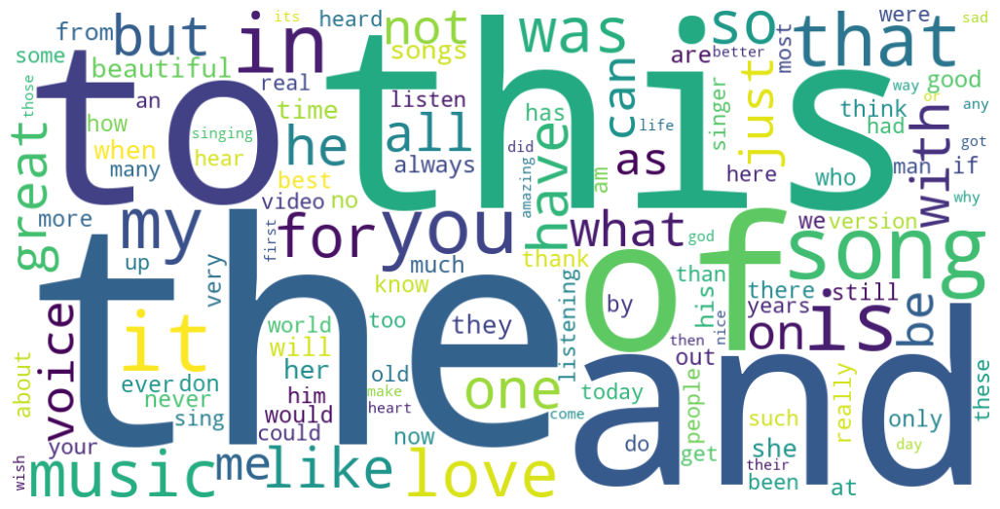


For category nostalgia we filter the following words:
Bottom 1.0% words: 
yo         1
yet        1
yester     1
yeas       1
yearn      1
yeah       1
1952       1
1950       1
1969       1
1964       1
lp         1
safety     1
safer      1
saddest    1
seeing     1
lou        1
proud      1
protest    1
2002       1
yup        1
1927       1
11th       1
dtype: int64
Top 5.0% words: 
little     30
will       30
passed     31
came       31
makes      31
         ... 
and       472
to        543
this      545
my        566
the       643
Length: 114, dtype: int64


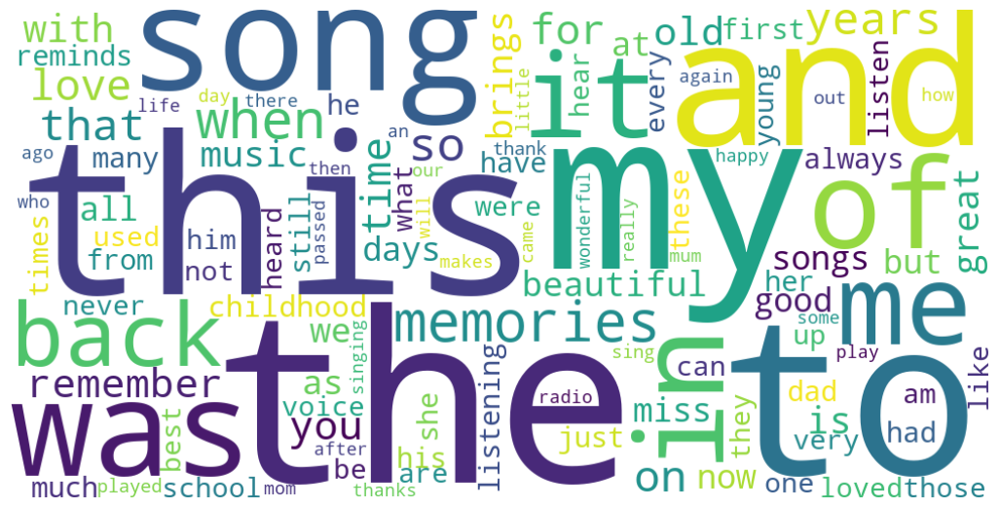

Filtered Term-Document Frequency DataFrame for Category nostalgia:


,07,10,11,12,13,14,15,16,17,18,...,yesterday,yokel,younger,youngster,your,yours,youth,youthful,youtube,yrs
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
745,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
746,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
747,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
748,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [35]:
from wordcloud import WordCloud

# Filter the bottom 1% and top 5% words based on their sum across all documents
def filter_top_bottom_words_by_sum(term_document_df, top_percent=0.05, bottom_percent=0.01):
    # Calculate the sum of each word across all documents
    word_sums = term_document_df.sum(axis=0)
    
    # Sort the words by their total sum
    sorted_words = word_sums.sort_values()
    
    # Calculate the number of words to remove
    total_words = len(sorted_words)
    top_n = int(top_percent * total_words)
    bottom_n = int(bottom_percent * total_words)
    
    # Get the words to remove from the top 5% and bottom 1%
    words_to_remove = pd.concat([sorted_words.head(bottom_n), sorted_words.tail(top_n)]).index
    print(f'Bottom {bottom_percent*100}% words: \n{sorted_words.head(bottom_n)}') #Here we print which words correspond to the bottom percentage we filter
    print(f'Top {top_percent*100}% words: \n{sorted_words.tail(top_n)}') #Here we print which words correspond to the top percentage we filter

    # Generate word cloud for data visualization
    wordcloud = WordCloud(width=1000, height=500, background_color='white').generate_from_frequencies(sorted_words.tail(top_n))
    plt.figure(figsize=(13, 8))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()
    
    # Return the DataFrame without the filtered words
    return term_document_df.drop(columns=words_to_remove)

# Apply the filtering function to each category
term_document_dfs = {}

for category in categories:
    print(f'\nFor category {category} we filter the following words:')
    term_document_dfs[category] = filter_top_bottom_words_by_sum(filt_term_document_dfs[category])

# Example: Display the filtered DataFrame for one of the categories
print(f"Filtered Term-Document Frequency DataFrame for Category {categories[category_number]}:")
term_document_dfs[categories[category_number]]


#### Observations: 
1. Each category feature dates (more specifically, years) in the bottom 1% words.
2. Other than stop words, terms related to music like "song" and "singing" can also be found in both categories.
3. The number of misspelled words is too small to be significant, indicating that the data is relatively clean.

#### Frequent Pattern Mining

In [ ]:
from PAMI.extras.DF2DB import DenseFormatDF as db

# Loop through the dictionary of term-document DataFrames
for category in term_document_dfs:
    # Replace dots with underscores in the category name to avoid errors in the file creation
    category_safe = category.replace('.', '_')
    
    # Create the DenseFormatDF object and convert to a transactional database
    obj = db.DenseFormatDF(term_document_dfs[category])
    obj.convert2TransactionalDatabase(f'td_freq_db_{category_safe}.csv', '>=', 1)

Database size (total no of transactions) : 734
Number of items : 2159
Minimum Transaction Size : 1
Average Transaction Size : 8.696185286103542
Maximum Transaction Size : 39
Standard Deviation Transaction Size : 7.20498326251217
Variance in Transaction Sizes : 51.982604800547186
Sparsity : 0.9959721235358483


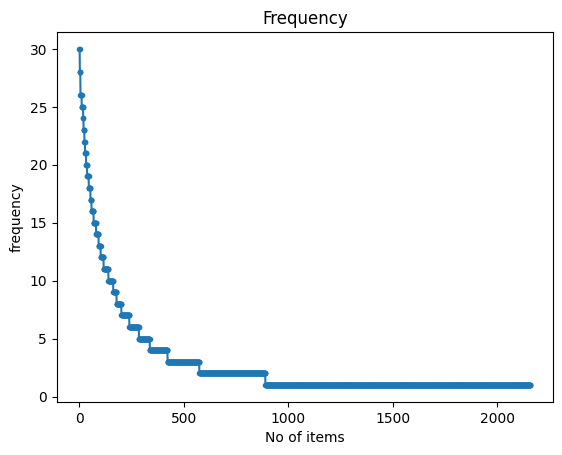

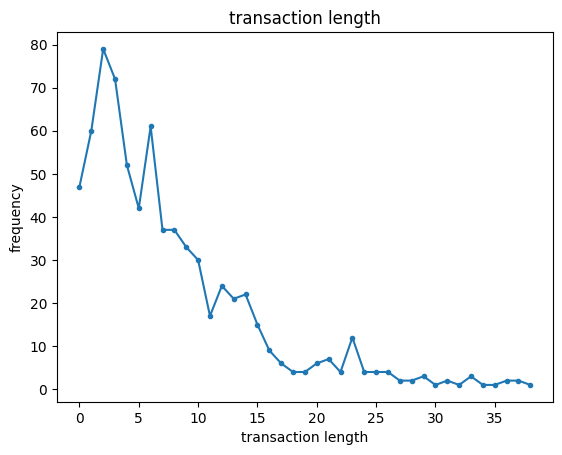

In [36]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('td_freq_db_nostalgia.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

Database size (total no of transactions) : 746
Number of items : 2446
Minimum Transaction Size : 1
Average Transaction Size : 8.399463806970509
Maximum Transaction Size : 47
Standard Deviation Transaction Size : 5.940834266064001
Variance in Transaction Sizes : 35.3408856181514
Sparsity : 0.9965660409619908


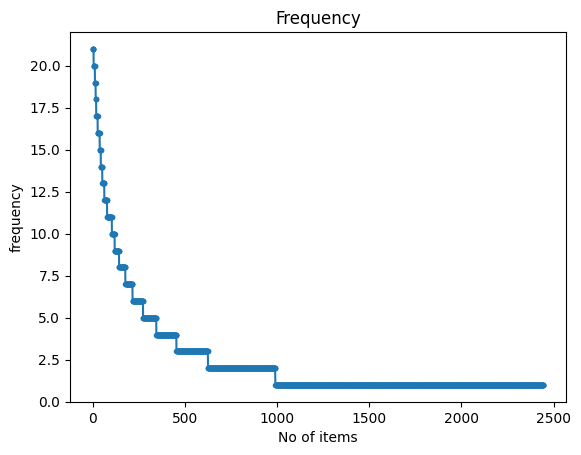

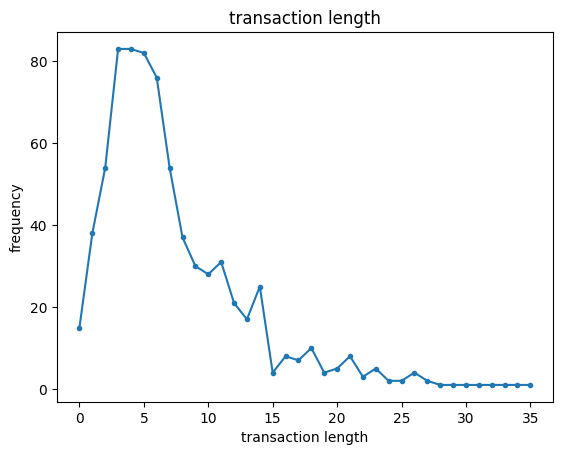

In [37]:
from PAMI.extras.dbStats import TransactionalDatabase as tds
obj = tds.TransactionalDatabase('td_freq_db_not nostalgia.csv')
obj.run()
obj.printStats()
obj.plotGraphs()

In [38]:
from PAMI.frequentPattern.basic import FPGrowth as alg
minSup=9
obj0 = alg.FPGrowth(iFile='td_freq_db_nostalgia.csv', minSup=minSup)
obj0.mine()
frequentPatternsDF_nostalgia= obj0.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj0.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 180
Runtime: 0.01579427719116211


In [39]:
obj1 = alg.FPGrowth(iFile='td_freq_db_not nostalgia.csv', minSup=minSup)
obj1.mine()
frequentPatternsDF_not_nostalgia= obj1.getPatternsAsDataFrame()
print('Total No of patterns: ' + str(len(frequentPatternsDF_not_nostalgia))) #print the total number of patterns
print('Runtime: ' + str(obj1.getRuntime())) #measure the runtime

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
Total No of patterns: 144
Runtime: 0.017287492752075195


In [40]:
import pandas as pd

#We group together all of the dataframes related to our found patterns
dfs = [frequentPatternsDF_nostalgia, frequentPatternsDF_not_nostalgia]


# Identify patterns that appear in more than one category
# Count how many times each pattern appears across all dataframes
pattern_counts = {}
for df0 in dfs:
    for pattern in df0['Patterns']:
        if pattern not in pattern_counts:
            pattern_counts[pattern] = 1
        else:
            pattern_counts[pattern] += 1

# Filter out patterns that appear in more than one dataframe
unique_patterns = {pattern for pattern, count in pattern_counts.items() if count == 1}
# Calculate the total number of patterns across all categories
total_patterns_count = sum(len(df0) for df0 in dfs)
# Calculate how many patterns were discarded
discarded_patterns_count = total_patterns_count - len(unique_patterns)

# For each category, filter the patterns to keep only the unique ones
filtered_dfs = []
for df0 in dfs:
    filtered_df = df0[df0['Patterns'].isin(unique_patterns)]
    filtered_dfs.append(filtered_df)

# Merge the filtered dataframes into a final dataframe
final_pattern_df = pd.concat(filtered_dfs, ignore_index=True)

# Sort by support
final_pattern_df = final_pattern_df.sort_values(by='Support', ascending=False)

# Display the final result
print(final_pattern_df)
# Print the number of discarded patterns
print(f"Number of patterns discarded: {discarded_patterns_count}")

    Patterns  Support
127    takes       30
125     ever       28
126    would       28
123       or       26
120      kid       26
..       ...      ...
135   others        9
136     pure        9
137   please        9
138   though        9
139   wonder        9

[220 rows x 2 columns]
Number of patterns discarded: 104


In [43]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer

# Convert 'text' column into term-document matrix using CountVectorizer
count_vect = CountVectorizer()
df_tdm = count_vect.fit_transform(df.comment)  # df['comment'] contains your text data
terms = count_vect.get_feature_names_out()  # Original terms in the vocabulary

# Tokenize the sentences into sets of unique words
df['tokenized_text'] = df['comment'].str.split().apply(set)

# Initialize the pattern matrix
pattern_matrix = pd.DataFrame(0, index=df.index, columns=final_pattern_df['Patterns'])

# Iterate over each pattern and check if all words in the pattern are present in the tokenized sentence
for pattern in final_pattern_df['Patterns']:
    pattern_words = set(pattern.split())  # Tokenize pattern into words
    pattern_matrix[pattern] = df['tokenized_text'].apply(lambda x: 1 if pattern_words.issubset(x) else 0)

# Convert the term-document matrix to a DataFrame for easy merging
tdm_df = pd.DataFrame(df_tdm.toarray(), columns=terms, index=df.index)

# Concatenate the original TDM and the pattern matrix to augment the features
augmented_df = pd.concat([tdm_df, pattern_matrix], axis=1)

augmented_df

,00,000,045,07,10,100,10m,11,11th,12,...,almost,end,family,ones,things,others,pure,please,though,wonder
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1495,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1496,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1497,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1498,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


#### Compare performance of FAE Top-K and MaxFPGrowth algorithms (using nostalgia)

In [78]:
from PAMI.frequentPattern.basic import FPGrowth as alg1
minSup= [6, 9, 12]
seperator='\t'

for i in minSup:
    obj = alg1.FPGrowth(iFile='td_freq_db_nostalgia.csv', minSup=i, sep = seperator)
    obj.mine()
    frequentPatternsDF_nostalgia= obj.getPatternsAsDataFrame()
    print('minSup: ' + str(i)) # minSup
    print('Total No of patterns: ' + str(len(frequentPatternsDF_nostalgia))) #print the total number of patterns
    print('Runtime: ' + str(obj.getRuntime())) #measure the runtime
    obj.save('MaxFPGrowth_nostalgia' + str(i) + '.txt') #save the patterns
    print(frequentPatternsDF_nostalgia)
    print('-------------------------------------------------')

Frequent patterns were generated successfully using frequentPatternGrowth algorithm
minSup: 6
Total No of patterns: 300
Runtime: 0.02405548095703125
     Patterns  Support
0        grow        6
1      sounds        6
2    reminded        6
3          18        6
4       album        6
..        ...      ...
295      ever       28
296     would       28
297        go       28
298     takes       30
299  favorite       30

[300 rows x 2 columns]
-------------------------------------------------
Frequent patterns were generated successfully using frequentPatternGrowth algorithm
minSup: 9
Total No of patterns: 180
Runtime: 0.01514887809753418
     Patterns  Support
0        find        9
1        down        9
2         few        9
3         its        9
4        sure        9
..        ...      ...
175      ever       28
176     would       28
177        go       28
178     takes       30
179  favorite       30

[180 rows x 2 columns]
-------------------------------------------------
Fr

In [81]:
from PAMI.frequentPattern.topk import FAE as alg2
k= [200, 400, 600]
seperator='\t'
for i in k:
    obj = alg2.FAE(iFile='td_freq_db_nostalgia.csv', k=i, sep = seperator)
    obj.mine()
    frequentPatternsDF_nostalgia= obj.getPatternsAsDataFrame()
    print('k: ' + str(i)) # k-value
    print('Total No of patterns: ' + str(len(frequentPatternsDF_nostalgia))) #print the total number of patterns
    print('Runtime: ' + str(obj.getRuntime())) #measure the runtime
    obj.save('FAETopK_nostalgia' + str(i) + '.txt') #save the patterns
    print(frequentPatternsDF_nostalgia)
    print('-------------------------------------------------')

 TopK frequent patterns were successfully generated using FAE algorithm.
k: 200
Total No of patterns: 200
Runtime: 0.03484940528869629
     Patterns  Support
0       takes       30
1    favorite       30
2        ever       28
3       would       28
4          go       28
..        ...      ...
195      mind        8
196   another        8
197    better        8
198        12        8
199     grade        8

[200 rows x 2 columns]
-------------------------------------------------
 TopK frequent patterns were successfully generated using FAE algorithm.
k: 400
Total No of patterns: 400
Runtime: 0.0867617130279541
     Patterns  Support
0       takes       30
1    favorite       30
2        ever       28
3       would       28
4          go       28
..        ...      ...
395     pilot        4
396   moments        4
397       50s        4
398     disco        4
399   parties        4

[400 rows x 2 columns]
-------------------------------------------------
 TopK frequent patterns were su

Observations are the same as in Lab 1 Master.

### Dimensionality Reduction (PCA components = 2)

#### Using the document-term frequency data

In [45]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap
import matplotlib.pyplot as plt

#This might take a couple of minutes to execute
# Apply PCA, t-SNE, and UMAP to the data
df_pca_tdm = PCA(n_components=2).fit_transform(tdm_df.values)
df_tsne_tdm = TSNE(n_components=2).fit_transform(tdm_df.values)
df_umap_tdm = umap.UMAP(n_components=2).fit_transform(tdm_df.values)

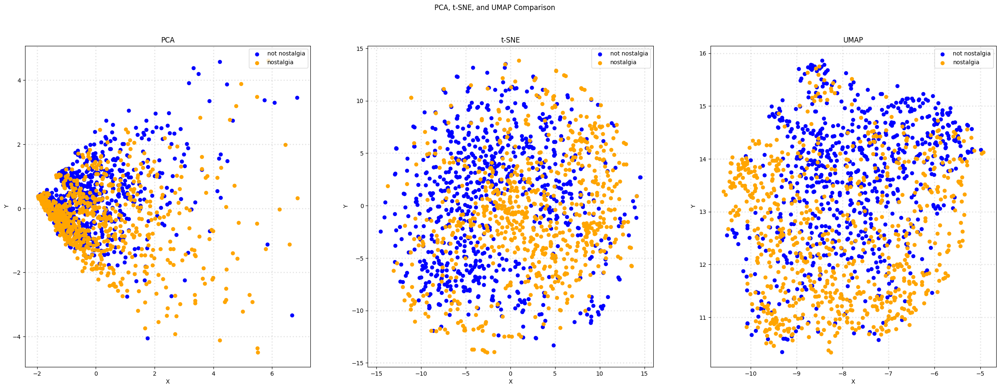

In [46]:
# Plot the results in subplots
col = ['blue', 'orange']
categories = df['sentiment'].unique() 

fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, df_reduced, title):
    for c, category in zip(col, categories):
        xs = df_reduced[df['sentiment'] == category].T[0]
        ys = df_reduced[df['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Step 4: Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], df_pca_tdm, 'PCA')
plot_scatter(axes[1], df_tsne_tdm, 't-SNE')
plot_scatter(axes[2], df_umap_tdm, 'UMAP')

plt.show()

#### Using both the document-term frequency data and the pattern derived data

In [47]:
#This might take a couple of minutes to execute
#Applying dimensionality reduction with both the document-term frequency data and the pattern derived data
# Apply PCA, t-SNE, and UMAP to the data
df_pca_aug = PCA(n_components=2).fit_transform(augmented_df.values)
df_tsne_aug = TSNE(n_components=2).fit_transform(augmented_df.values)
df_umap_aug = umap.UMAP(n_components=2).fit_transform(augmented_df.values)

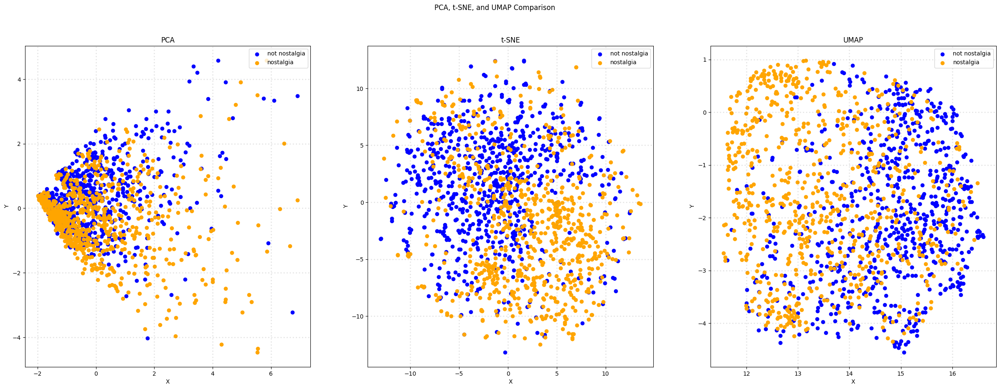

In [48]:
# Plot the results in subplots
fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# Define a function to create a scatter plot for each method
def plot_scatter(ax, df_reduced, title):
    for c, category in zip(col, categories):
        xs = df_reduced[df['sentiment'] == category].T[0]
        ys = df_reduced[df['sentiment'] == category].T[1]
        ax.scatter(xs, ys, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

# Create scatter plots for PCA, t-SNE, and UMAP
plot_scatter(axes[0], df_pca_aug, 'PCA')
plot_scatter(axes[1], df_tsne_aug, 't-SNE')
plot_scatter(axes[2], df_umap_aug, 'UMAP')

plt.show()

### Dimensionality Reduction (PCA components = 3)

In [49]:
# Answer here
# reduce dimension to 3
df_pca_aug = PCA(n_components=3).fit_transform(augmented_df.values)
df_tsne_aug = TSNE(n_components=3).fit_transform(augmented_df.values)
df_umap_aug = umap.UMAP(n_components=3).fit_transform(augmented_df.values)

In [50]:
from mpl_toolkits.mplot3d import Axes3D

# Define a function to create a scatter plot for each method
def plot_scatter_3d(ax, df_reduced, title):
    for c, category in zip(col, categories):
        xs = df_reduced[df['sentiment'] == category].T[0]
        ys = df_reduced[df['sentiment'] == category].T[1]
        zs = df_reduced[df['sentiment'] == category].T[2]
        ax.scatter(xs, ys, zs, c=c, marker='o', label=category)
    
    ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
    ax.set_title(title)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.legend(loc='upper right')

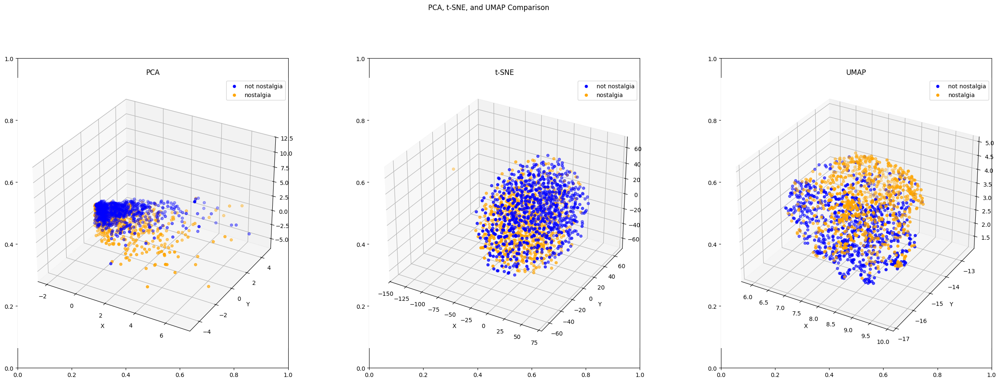

In [51]:
fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# PCA subplot (1st angle - default)
ax1 = fig.add_subplot(131, projection='3d')  #format of 131 = abc (a - no. of rows, b - no. of columns, c - position in graph)
plot_scatter_3d(ax1, df_pca_aug, 'PCA')
#ax1.view_init(elev=30, azim=45)

# t-SNE subplot
ax2 = fig.add_subplot(132, projection='3d') 
plot_scatter_3d(ax2, df_tsne_aug, 't-SNE')

# UMAP subplot
ax3 = fig.add_subplot(133, projection='3d')  
plot_scatter_3d(ax3, df_umap_aug, 'UMAP')

# Adjust the layout and display the plot
plt.subplots_adjust(top=0.85, wspace=0.3)
plt.show()

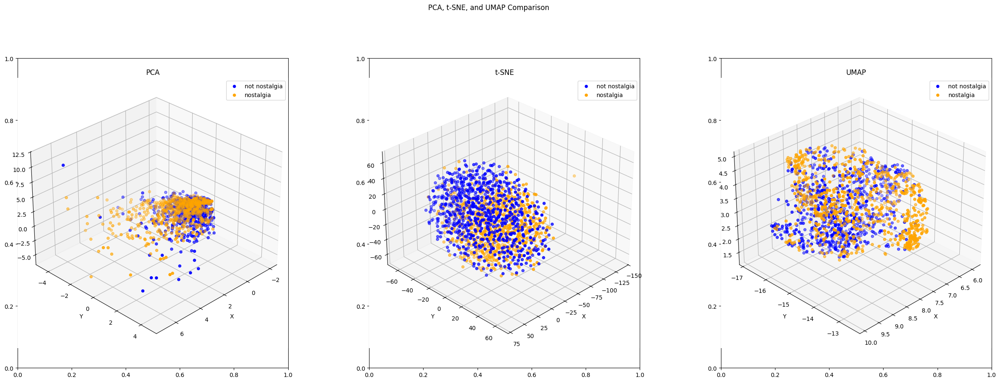

In [52]:
fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# PCA subplot (2nd angle - elev=30, azim=45)
ax1 = fig.add_subplot(131, projection='3d')  #format of 131 = abc (a - no. of rows, b - no. of columns, c - position in graph)
plot_scatter_3d(ax1, df_pca_aug, 'PCA')
ax1.view_init(elev=30, azim=45)

# t-SNE subplot
ax2 = fig.add_subplot(132, projection='3d') 
plot_scatter_3d(ax2, df_tsne_aug, 't-SNE')
ax2.view_init(elev=30, azim=45)

# UMAP subplot
ax3 = fig.add_subplot(133, projection='3d')  
plot_scatter_3d(ax3, df_umap_aug, 'UMAP')
ax3.view_init(elev=30, azim=45)

# Adjust the layout and display the plot
plt.subplots_adjust(top=0.85, wspace=0.3)
plt.show()

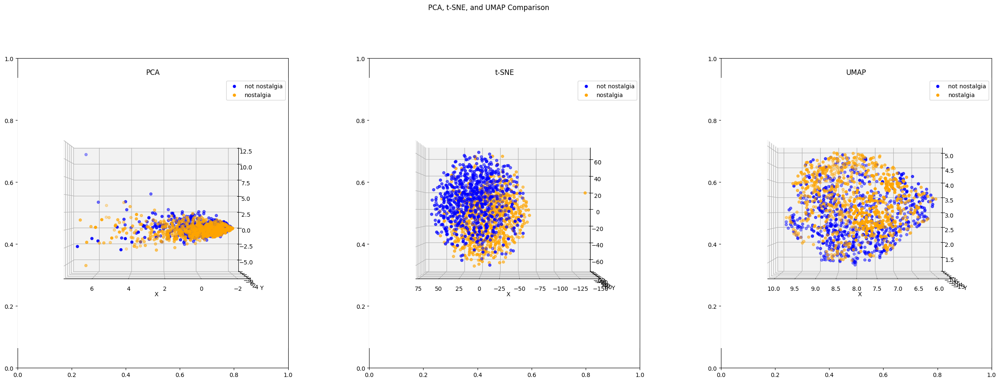

In [53]:
fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# PCA subplot (3rd angle - elev=0, azim=90)
ax1 = fig.add_subplot(131, projection='3d')  #format of 131 = abc (a - no. of rows, b - no. of columns, c - position in graph)
plot_scatter_3d(ax1, df_pca_aug, 'PCA')
ax1.view_init(elev=0, azim=90)

# t-SNE subplot
ax2 = fig.add_subplot(132, projection='3d') 
plot_scatter_3d(ax2, df_tsne_aug, 't-SNE')
ax2.view_init(elev=0, azim=90)

# UMAP subplot
ax3 = fig.add_subplot(133, projection='3d')  
plot_scatter_3d(ax3, df_umap_aug, 'UMAP')
ax3.view_init(elev=0, azim=90)

# Adjust the layout and display the plot
plt.subplots_adjust(top=0.85, wspace=0.3)
plt.show()

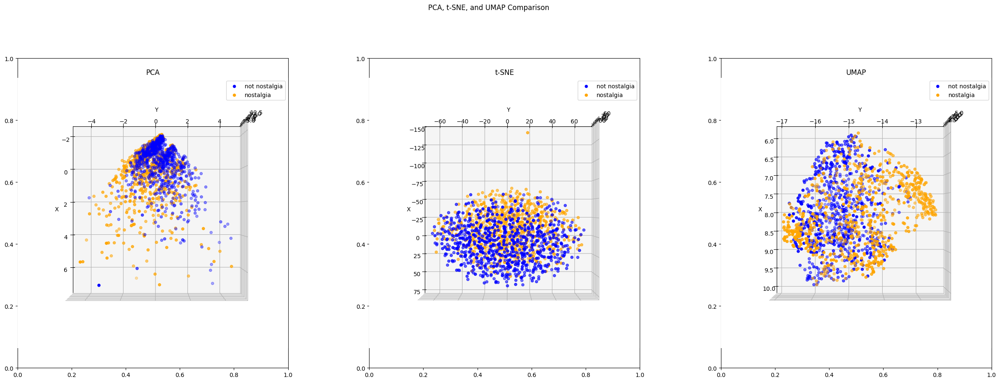

In [54]:
fig, axes = plt.subplots(1, 3, figsize=(30, 10))  # Create 3 subplots for PCA, t-SNE, and UMAP
fig.suptitle('PCA, t-SNE, and UMAP Comparison')

# PCA subplot (4th angle - elev=90, azim=0)
ax1 = fig.add_subplot(131, projection='3d')  #format of 131 = abc (a - no. of rows, b - no. of columns, c - position in graph)
plot_scatter_3d(ax1, df_pca_aug, 'PCA')
ax1.view_init(elev=90, azim=0)

# t-SNE subplot
ax2 = fig.add_subplot(132, projection='3d') 
plot_scatter_3d(ax2, df_tsne_aug, 't-SNE')
ax2.view_init(elev=90, azim=0)

# UMAP subplot
ax3 = fig.add_subplot(133, projection='3d')  
plot_scatter_3d(ax3, df_umap_aug, 'UMAP')
ax3.view_init(elev=90, azim=0)

# Adjust the layout and display the plot
plt.subplots_adjust(top=0.85, wspace=0.3)
plt.show()

### Discretization and Binarization

In [55]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy

In [56]:
mlb = preprocessing.LabelBinarizer()
mlb.fit(df.sentiment)
df['bin_category'] = 1- mlb.transform(df['sentiment']).flatten()
df[0:9]

,sentiment,comment,unigrams,tokenized_text,bin_category
0,not nostalgia,He was a singer with a golden voice that I lov...,"[He, was, a, singer, with, a, golden, voice, t...","{Thank, great, of, love, his, have, but,, You,...",0
1,nostalgia,The mist beautiful voice ever I listened to hi...,"[The, mist, beautiful, voice, ever, I, listene...","{of, love, his, an, ever, mist, still, angel, ...",1
2,nostalgia,I have most of Mr. Reeves songs. Always love ...,"[I, have, most, of, Mr., Reeves, songs, ., Alw...","{think, graduated, great, of, comforting, arou...",1
3,not nostalgia,30 day leave from 1st tour in Viet Nam to conv...,"[30, day, leave, from, 1st, tour, in, Viet, Na...","{from, tour., Now,, Thank, blessing, granted, ...",0
4,nostalgia,listening to his songs reminds me of my mum wh...,"[listening, to, his, songs, reminds, me, of, m...","{reminds, listening, played, songs, of, me, wh...",1
5,nostalgia,"Every time I heard this song as a child, I use...","[Every, time, I, heard, this, song, as, a, chi...","{Reeves,, Now, death,, your, as, of, song., ov...",1
6,nostalgia,"My dad loved listening to Jim Reeves, when I w...","[My, dad, loved, listening, to, Jim, Reeves, ,...","{Reeves,, loved, 70's, back, then,, teenager, ...",1
7,nostalgia,i HAVE ALSO LISTENED TO Jim Reeves since child...,"[i, HAVE, ALSO, LISTENED, TO, Jim, Reeves, sin...","{71, now, childhood, love, his, feeling, ALSO,...",1
8,not nostalgia,Wherever you are you always in my heart,"[Wherever, you, are, you, always, in, my, heart]","{heart, are, always, in, Wherever, my, you}",0


### Data Exploration

In [57]:
# We retrieve 3 sentences for a random record
document_to_transform_1 = []
random_record_1 = df.iloc[50]
random_record_1 = random_record_1['comment']
document_to_transform_1.append(random_record_1)

document_to_transform_2 = []
random_record_2 = df.iloc[100]
random_record_2 = random_record_2['comment']
document_to_transform_2.append(random_record_2)

document_to_transform_3 = []
random_record_3 = df.iloc[150]
random_record_3 = random_record_3['comment']
document_to_transform_3.append(random_record_3)

In [58]:
print(document_to_transform_1)
print(document_to_transform_2)
print(document_to_transform_3)

['If I remember correctly, this song came out after Mr. Reeves passed away. I was about 10 years old when the disc jockey said that the news just came over the wire that he died in a plane crash.']
['i guess most of us leave it too late before we tell someone just how much we really love them']
['my name is thomas but know by tommy and my wifes name is laura and i always sing this to her']


In [59]:
from sklearn.preprocessing import binarize

# Transform sentence with Vectorizers
document_vector_count_1 = count_vect.transform(document_to_transform_1)
document_vector_count_2 = count_vect.transform(document_to_transform_2)
document_vector_count_3 = count_vect.transform(document_to_transform_3)

# Binarize vectors to simplify: 0 for absence, 1 for presence
document_vector_count_1_bin = binarize(document_vector_count_1)
document_vector_count_2_bin = binarize(document_vector_count_2)
document_vector_count_3_bin = binarize(document_vector_count_3)

# print vectors
print("Let's take a look at the count vectors:")
print(document_vector_count_1.todense())
print(document_vector_count_2.todense())
print(document_vector_count_3.todense())

Let's take a look at the count vectors:
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]
[[0 0 0 ... 0 0 0]]


In [60]:
from sklearn.metrics.pairwise import cosine_similarity

# Calculate Cosine Similarity
cos_sim_count_1_2 = cosine_similarity(document_vector_count_1, document_vector_count_2, dense_output=True)
cos_sim_count_1_3 = cosine_similarity(document_vector_count_1, document_vector_count_3, dense_output=True)
cos_sim_count_2_3 = cosine_similarity(document_vector_count_2, document_vector_count_3, dense_output=True)

cos_sim_count_1_1 = cosine_similarity(document_vector_count_1, document_vector_count_1, dense_output=True)
cos_sim_count_2_2 = cosine_similarity(document_vector_count_2, document_vector_count_2, dense_output=True)
cos_sim_count_3_3 = cosine_similarity(document_vector_count_3, document_vector_count_3, dense_output=True)

# Print 
print("Cosine Similarity using count bw 1 and 2: %(x)f" %{"x":cos_sim_count_1_2})
print("Cosine Similarity using count bw 1 and 3: %(x)f" %{"x":cos_sim_count_1_3})
print("Cosine Similarity using count bw 2 and 3: %(x)f" %{"x":cos_sim_count_2_3})

print("Cosine Similarity using count bw 1 and 1: %(x)f" %{"x":cos_sim_count_1_1})
print("Cosine Similarity using count bw 2 and 2: %(x)f" %{"x":cos_sim_count_2_2})
print("Cosine Similarity using count bw 3 and 3: %(x)f" %{"x":cos_sim_count_3_3})

Cosine Similarity using count bw 1 and 2: 0.032174
Cosine Similarity using count bw 1 and 3: 0.027864
Cosine Similarity using count bw 2 and 3: 0.000000
Cosine Similarity using count bw 1 and 1: 1.000000
Cosine Similarity using count bw 2 and 2: 1.000000
Cosine Similarity using count bw 3 and 3: 1.000000


E:\AppData\Local\Temp\ipykernel_14384\452772485.py:13: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

E:\AppData\Local\Temp\ipykernel_14384\452772485.py:14: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

E:\AppData\Local\Temp\ipykernel_14384\452772485.py:15: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)

E:\AppData\Local\Temp\ipykernel_14384\452772485.py:17: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. 

### Data Classification using Bernoulli Naive Bayes

#### Using word frequency features

In [61]:
#Model with only the document-term frequency data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping = dict(df[['bin_category', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(tdm_df, df['sentiment'], test_size=0.3, random_state=42)

In [62]:
print(X_train)
print(X_test)

      00  000  045  07  10  100  10m  11  11th  12  ...  yours  yourself  \
486    0    0    0   0   0    0    0   0     0   0  ...      0         0   
528    0    0    0   0   0    0    0   0     0   0  ...      0         0   
200    0    0    0   0   0    0    0   0     0   0  ...      0         0   
890    0    0    0   0   0    0    0   0     0   0  ...      0         0   
845    0    0    0   0   0    0    0   0     0   0  ...      0         0   
...   ..  ...  ...  ..  ..  ...  ...  ..   ...  ..  ...    ...       ...   
1131   0    0    0   0   0    0    0   0     0   0  ...      0         0   
1295   0    0    0   0   0    0    0   0     0   0  ...      0         0   
861    0    0    0   0   0    0    0   0     0   0  ...      0         0   
1460   0    0    0   0   0    0    0   0     0   0  ...      0         0   
1127   0    0    0   0   0    0    0   0     0   0  ...      0         0   

      youth  youthful  youtube  yrs  yuo  yup  zealand  zulus  
486       0         0  

In [63]:
# Train the Naive Bayes classifier
nb_classifier = BernoulliNB() 
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8844444444444445

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8521    0.9399    0.8939       233
    nostalgia     0.9275    0.8249    0.8732       217

     accuracy                         0.8844       450
    macro avg     0.8898    0.8824    0.8835       450
 weighted avg     0.8885    0.8844    0.8839       450



#### Using TF-IDF features

In [64]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(tfidf, df['sentiment'], test_size=0.3, random_state=42)

In [65]:
print(X_train)
print(X_test)

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 22109 stored elements and shape (1049, 3730)>
  Coords	Values
  (0, 1015)	0.3250216498653815
  (0, 1713)	0.3187018744493404
  (0, 1969)	0.2529137141395679
  (0, 3039)	0.4063929537749913
  (0, 3044)	0.14581969141697884
  (0, 3291)	0.31064961927636825
  (0, 3300)	0.12768704741335662
  (0, 3650)	0.22890275815857788
  (0, 3692)	0.439315856086886
  (0, 3713)	0.42918995575716196
  (1, 149)	0.30748432512023177
  (1, 258)	0.16707308863344264
  (1, 410)	0.1454326182938173
  (1, 1015)	0.18877960824332488
  (1, 1435)	0.19448889797300986
  (1, 1451)	0.2625796412168271
  (1, 1478)	0.2975790447659249
  (1, 1559)	0.2551641567308302
  (1, 1598)	0.15329582255577412
  (1, 2030)	0.21381254642132824
  (1, 2073)	0.19906921760149782
  (1, 2114)	0.11001591698151209
  (1, 2237)	0.16243353814913628
  (1, 2341)	0.08982281757424744
  (1, 2382)	0.17395316814167644
  :	:
  (1048, 214)	0.21459177934282594
  (1048, 273)	0.23265585792926183
  (1048, 410)	0

In [66]:
# Train the Naive Bayes classifier
nb_classifier = BernoulliNB() # Better than Multinomial
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8844444444444445

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8521    0.9399    0.8939       233
    nostalgia     0.9275    0.8249    0.8732       217

     accuracy                         0.8844       450
    macro avg     0.8898    0.8824    0.8835       450
 weighted avg     0.8885    0.8844    0.8839       450



### Data Classification using Multinomial Naive Bayes

#### Using word frequency features

In [67]:
#Model with only the document-term frequency data
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score

# Create a mapping from numerical labels to category names
category_mapping = dict(df[['bin_category', 'sentiment']].drop_duplicates().values)

# Convert the numerical category labels to text labels
target_names = [category_mapping[label] for label in sorted(category_mapping.keys())]

# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(tdm_df, df['sentiment'], test_size=0.3, random_state=42)

In [68]:
print(X_train)
print(X_test)

      00  000  045  07  10  100  10m  11  11th  12  ...  yours  yourself  \
486    0    0    0   0   0    0    0   0     0   0  ...      0         0   
528    0    0    0   0   0    0    0   0     0   0  ...      0         0   
200    0    0    0   0   0    0    0   0     0   0  ...      0         0   
890    0    0    0   0   0    0    0   0     0   0  ...      0         0   
845    0    0    0   0   0    0    0   0     0   0  ...      0         0   
...   ..  ...  ...  ..  ..  ...  ...  ..   ...  ..  ...    ...       ...   
1131   0    0    0   0   0    0    0   0     0   0  ...      0         0   
1295   0    0    0   0   0    0    0   0     0   0  ...      0         0   
861    0    0    0   0   0    0    0   0     0   0  ...      0         0   
1460   0    0    0   0   0    0    0   0     0   0  ...      0         0   
1127   0    0    0   0   0    0    0   0     0   0  ...      0         0   

      youth  youthful  youtube  yrs  yuo  yup  zealand  zulus  
486       0         0  

In [69]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB() 
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8688888888888889

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8222    0.9528    0.8827       233
    nostalgia     0.9389    0.7788    0.8514       217

     accuracy                         0.8689       450
    macro avg     0.8806    0.8658    0.8670       450
 weighted avg     0.8785    0.8689    0.8676       450



#### Using TF-IDF features

In [70]:
# Split the data into training and testing sets (70% train, 30% test)
X_train, X_test, y_train, y_test = train_test_split(tfidf, df['sentiment'], test_size=0.3, random_state=42)

In [71]:
print(X_train)
print(X_test)

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 22109 stored elements and shape (1049, 3730)>
  Coords	Values
  (0, 1015)	0.3250216498653815
  (0, 1713)	0.3187018744493404
  (0, 1969)	0.2529137141395679
  (0, 3039)	0.4063929537749913
  (0, 3044)	0.14581969141697884
  (0, 3291)	0.31064961927636825
  (0, 3300)	0.12768704741335662
  (0, 3650)	0.22890275815857788
  (0, 3692)	0.439315856086886
  (0, 3713)	0.42918995575716196
  (1, 149)	0.30748432512023177
  (1, 258)	0.16707308863344264
  (1, 410)	0.1454326182938173
  (1, 1015)	0.18877960824332488
  (1, 1435)	0.19448889797300986
  (1, 1451)	0.2625796412168271
  (1, 1478)	0.2975790447659249
  (1, 1559)	0.2551641567308302
  (1, 1598)	0.15329582255577412
  (1, 2030)	0.21381254642132824
  (1, 2073)	0.19906921760149782
  (1, 2114)	0.11001591698151209
  (1, 2237)	0.16243353814913628
  (1, 2341)	0.08982281757424744
  (1, 2382)	0.17395316814167644
  :	:
  (1048, 214)	0.21459177934282594
  (1048, 273)	0.23265585792926183
  (1048, 410)	0

In [72]:
# Train the Naive Bayes classifier
nb_classifier = MultinomialNB()
nb_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = nb_classifier.predict(X_test)

# Evaluate the classifier
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=target_names, digits=4))

Accuracy: 0.8622222222222222

Classification Report:
                precision    recall  f1-score   support

not nostalgia     0.8132    0.9528    0.8775       233
    nostalgia     0.9379    0.7650    0.8426       217

     accuracy                         0.8622       450
    macro avg     0.8755    0.8589    0.8601       450
 weighted avg     0.8733    0.8622    0.8607       450



**Findings:**
1. When applying Bernoulli Naïve Bayes on the dataset, the accuracy and classification report when using word frequency and TF-IDF features are the same (i.e., \~88%). 
2. Bernoulli Naïve Bayes (\~88%) achieved a higher accuracy than Multinomial Naïve Bayes (\~86%).
3. When applying Multinomial Naïve Bayes, the accuracy is slightly higher when we use word frequency features (\~86. 89%) as compared to TF-IDF features (\~86.22%).
4. Overall, the differences between each model are as follows:

_Legend:_

Bernoulli (either word frequency or TF-IDF) : BNB,

Multinomial (using word frequency) : MWF, 

Multinomial (using TF-IDF) : MTI

= : same performance

\> : surpasses


* Precision (not nostalgia): BNB (0.8521) > MWF (0.8222) > MTI (0.8132)
* Precision (nostalgia): MWF (0.9389) > MTI (0.9379) > BNB (0.9275)
* Precision (macro average): BNB (0.8898) > MWF (0.8806) > MTI (0.8755)
* Precision (weighted average): BNB (0.8885) > MWF (0.8785) > MTI (0.8733)

* Recall (not nostalgia): MWF (0.9528) =  MTI (0. 9528) > BNB (0.9399) 
* Recall (nostalgia): BNB (0.8249) > MWF (0.7788) > MTI (0.7650)
* Recall (macro average): BNB (0.8824) > MWF (0.8658) > MTI (0.8589)
* Recall (weighted average): BNB (0.8844) > MWF (0.8689) > MTI (0.8622)

* F1-score (not nostalgia):  BNB (0.8939) > MWF (0.8827) > MTI (0.8775)
* F1-score (nostalgia):  BNB (0.8732) > MWF (0.8514) > MTI (0.8426)
* F1-score (macro average): BNB (0.8835) > MWF (0.8670) > MTI (0.8601)
* F1-score (weighted average): BNB (0.8839) > MWF (0.8676) > MTI (0.8607)

* Accuracy : BNB (0.8844) > MWF (0.8689) > MTI (0.8622)


## Comments

In some parts of data preprocessing, stop words are highly evident in the graphs, which makes it harder for us to identify meaningful patterns in the dataset as they do not hold significant value in the data. Moreover, many misspelled words and words having same root word are seen in both Homework and Master datasets, which may affect the accuracy of the classification model. We could apply stemming techniques and removal of stop words to have a cleaner dataset and better data visualization. 

Furthermore, we carried out data visualization without considering the sentiment of each comment. It would be a great improvement if we also separated the comment data by sentiment categories, then produced graphs (e.g., heatmaps, bar graphs) per each category, which allows us to analyze patterns and spot differences between categories more effectively.

We can also use other data visualization methods, such as word clouds, that may provide new perspectives for the preprocessing and classification tasks.

Here is an example of a word cloud:

#### Additional data visualization: Word cloud

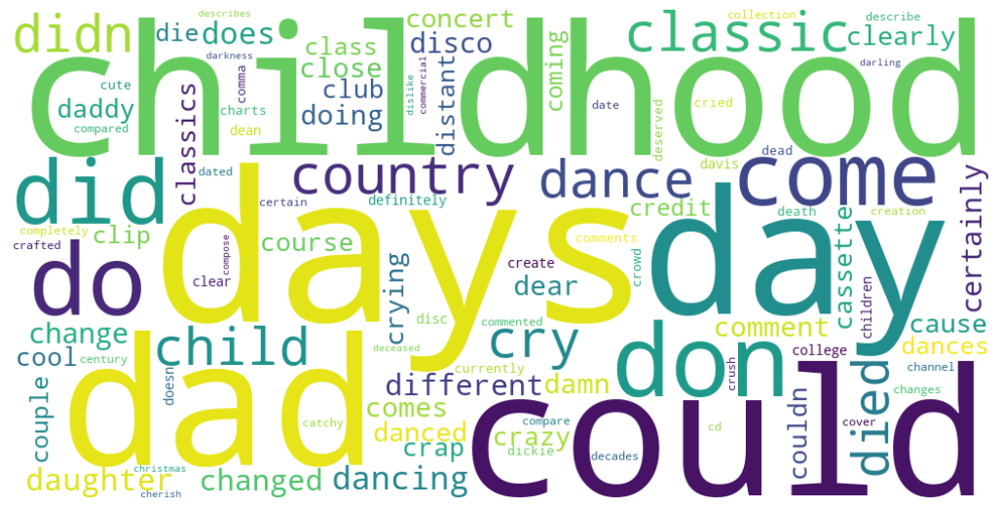

In [73]:
from wordcloud import WordCloud

word_frequencies = dictionary = dict(zip(x_sorted, y_sorted)) # note that we got x_sorted and y_sorted from previous bar graph 

wordcloud = WordCloud(width=1000, height=500, background_color='white').generate_from_frequencies(word_frequencies)
plt.figure(figsize=(13, 8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()